**Universidad Internacional de La Rioja (UNIR) - Máster Universitario en Inteligencia Artificial - Visión Artificial**

***
Datos del alumno (Nombre y Apellidos): Jorge García Otero

Fecha: 2024/11/24
***

#### **OBJETIVO**

Familiarizarnos con las técnicas y herramientas utilizadas, generalmente, para mejorar una imagen (eliminación de ruido, realce de detalles, etc.).

Principalmente, nos centraremos en las siguientes técnicas:

1.   Funciones de transformación o ajuste de la intensidad.
2.   Procesamiento del histograma.
3.   Operadores aritméticos.



# Cargando las imágenes
Comenzaremos por cargar las distintas imágenes seleccionadas, de forma aleatoria,  de la base de datos de Kaggle de **The Dark Face**.

OpenCV emplea por defecto el color BGR (Blue, Green Red) al leer imágenes. Al cargar la imagen y visualizarla con Matplotlib, que emplea formato RGB, se mostraban de forma incorrecta respecto al original. Es necesario por tanto convertir a RGB mediante la función cv2.cvtColor(), aplicando COLOR_BGR2_RGB


In [1]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt

In [68]:
def load_images(images_path):
    '''
    Carga las imágenes.
    Devuelve una lista con las imágenes en formato RBG (el que emplea OpenCV)
    args:
      images_path (list): path de imágenes
    returns:
      images (list): lista de imágenes
    '''
    images = []
    try:
      for path in images_path:
        image = cv2.imread(path)
        images.append(image)
    except Exception as e:
      print(f"Error al procesar la imagen '{path}': {e}")
    return images


In [74]:
def plot_images(images,titles, cols=2, figsize=(10,10)):
    '''
    Muestra una lista de imágenes con sus títulos correspondientes.
    args:
        images (list): lista de imagenes RGB
        titles (list): Lista de títulos para cada imagen.
        cols (int): número de columnas en la visualizacion. Por defecto es 2.
        figsize (tuple): tamaño de la figura. Por defecto es (10, 10).
    returns:
        N/A
    '''
    try:
      rows = (len(images) + cols - 1)
      plt.figure(figsize=figsize)
      for i, (image, title) in enumerate(zip(images, titles)):
          image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
          plt.subplot(rows, cols, i + 1)
          plt.imshow(image)
          plt.title(title)
          plt.axis('off')
      plt.tight_layout()
      plt.show()
    except Exception as e:
      print(f"Error al dibujar la imagen: {e}")


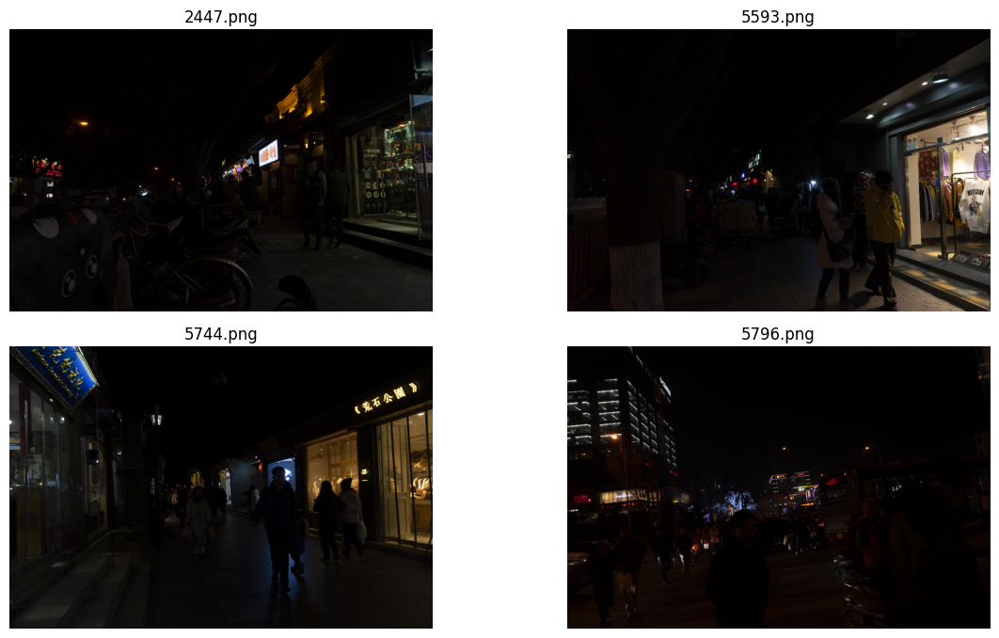

Imagen 1 tiene forma: (720, 1080, 3)
Imagen 2 tiene forma: (720, 1080, 3)
Imagen 3 tiene forma: (720, 1080, 3)
Imagen 4 tiene forma: (720, 1080, 3)


In [75]:
# Lista de rutas de las imágenes
images_path = [
    "vision_artificial/2447.png",
    "vision_artificial/5593.png",
    "vision_artificial/5744.png",
    "vision_artificial/5796.png"
]

# Lista de posiciones (subplots)
positions = [221, 222, 223, 224]  # Posiciones en una cuadrícula 2x2
titles = [os.path.basename(path) for path in images_path]

# Llamar a la función para cargar y mostrar las imágenes
images= load_images(images_path)
plot_images(images,titles, cols=2, figsize=(12,17))

for i, image in enumerate(images):
    print(f"Imagen {i+1} tiene forma: {image.shape}")


# 1. **Funciones de transformación o ajuste de la intensidad**

Son técnicas que permiten modificar los niveles de brillo y contraste de una imagen para mejorar su calidad visual o resaltar características específicas. Se aplican a los valores de intensidad de los píxeles, ajustando como se representan los tonos oscuros y claros de la imagen. Como estas funciones están orientadas a trabajar en escala de grises y trabajaremos con imagenes en color (ver el print del shape de la celda anterior), salvo en la transformación lineal positiva, que emplearemos una función de OpenCV, realizaremos una separación de los canales R,G,B para las distintas funciones.






#### **1.1. Transformación lineal negativa**
Como se indica en la memoria del laboratorio, la fórmula se representa por `s= (L-1)-r`, donde:

*   *s*:  Es la intensidad del píxel en la imagen transformada.
*   *L*:  Representa el máximo nivel de intensidad en la imagen (256 en caso de imágenes de 8 bits).
*   *r*:  Es la intensidad original

El código invierte las intensidades de los píxeles generando la imagen negativa correspondiente. Un valor de L=256 invierte totalmente las intensidades de las imágenes de 8 bits, con lo que se pueden apreciar figuras que antes no se veían. Sin embargo, no se produce una mejora en la imagen, ésta se va alterada por completo.

In [79]:
def negative_transform(image, L):
    '''
    Aplica la transformación negativa a una imagen.
    args:
        image (numpy.ndarray) : Imagen.
        L (int): Nivel de intensidad (máximo de 256 para imágenes de 8 bits).
    returns:
        negative_image(numpy.ndarray): Imagen transformada.
    '''
    # Separar los canales R, G, B
    r, g, b = cv2.split(image)
    # Aplicar la transformación negativa a cada canal
    r_neg = (L - 1) - r
    g_neg = (L - 1) - g
    b_neg = (L - 1) - b
    # Recombinar los canales transformados
    negative_image = cv2.merge((r_neg, g_neg, b_neg))
    return negative_image


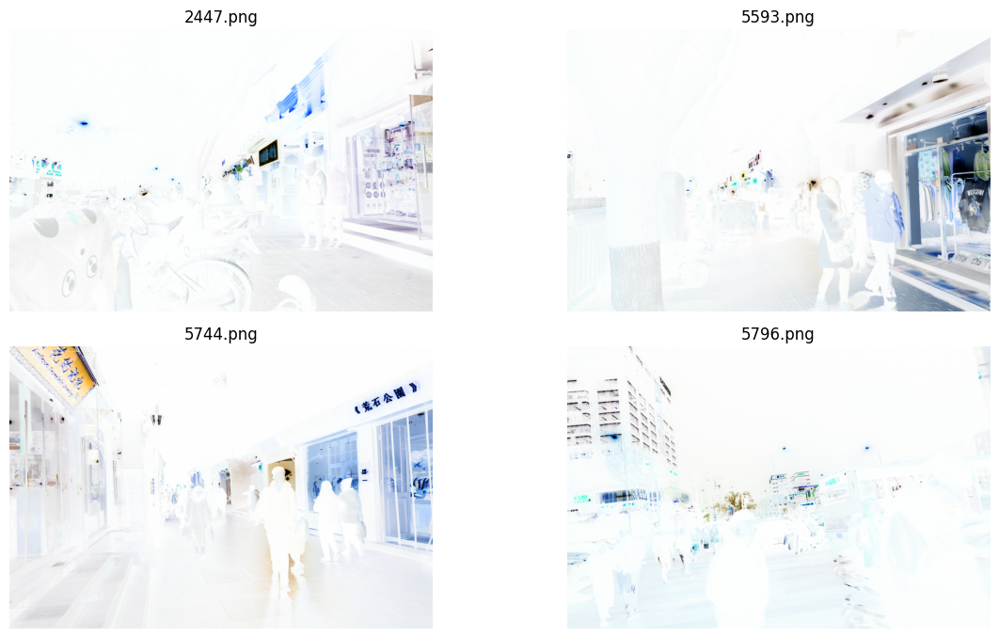

In [80]:
L = 256
# Aplicar la transformación negativa a todas las imágenes
negative_transform_images = [negative_transform(image, L) for image in images]
# Visualizar las imágenes negativas
plot_images(negative_transform_images, titles, cols=2, figsize=(12, 17))


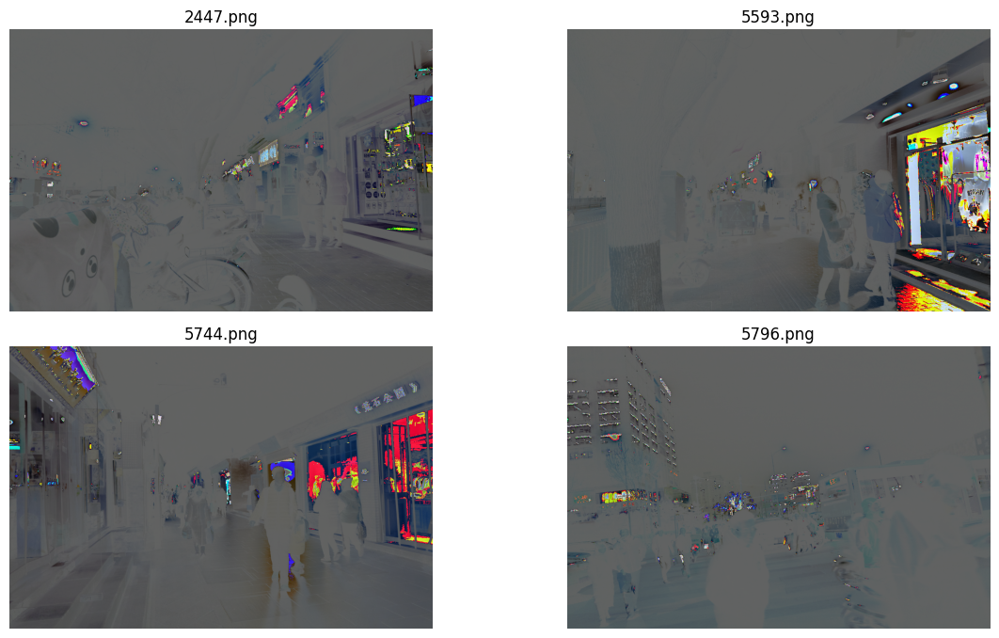

In [81]:
L = 100
negative_images=  [(L-1) - image for image in images]
plot_images(negative_images,titles, cols=2, figsize=(12,17))

#### **1.2. Transformación lineal positiva**
La fórmula se representa por s=a⋅r+b, donde:
*	s:  Intensidad del píxel en la imagen transformada.
*	r: Representa la intensidad del píxel de la imagen original.
*	a: Es el Factor de escala que controla el contraste (generalmente a>1)
*	b: Término de desplazamiento que ajusta el brillo (generalmente b>0)

Es posible utilizar la función de OpenCV convertScaleAbs para aplicar esta transformación.


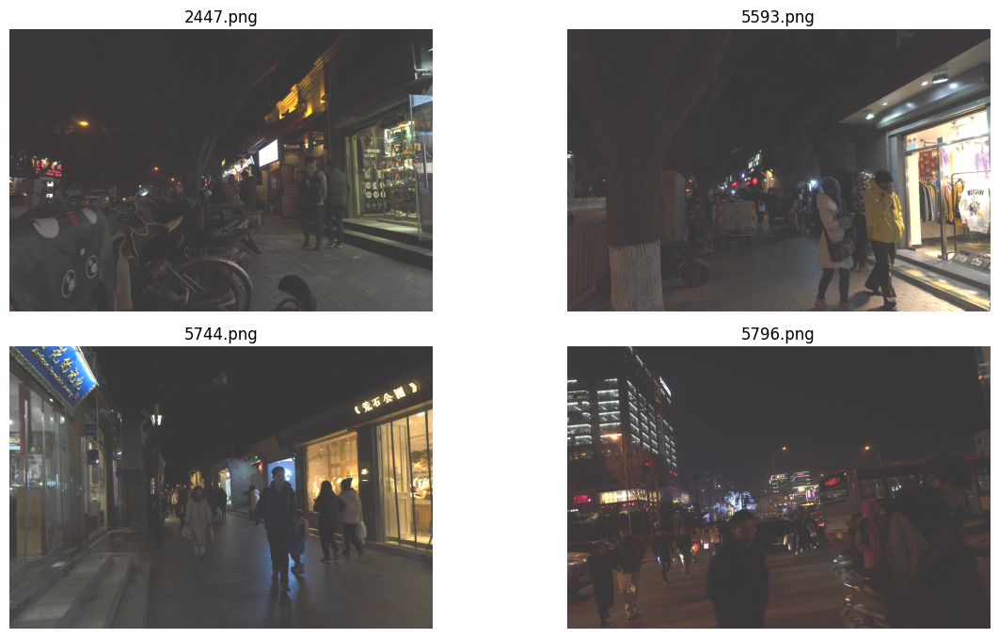

In [82]:
alpha = 1.5 #contraste
beta = 55  #brillo
positive_images = []
for image in images:
  positive_image  = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
  positive_images.append(positive_image)

plot_images(positive_images,titles, cols=2, figsize=(12,17))

La transformación lineal positiva no elimina ruido ni introduce realce no lineal. Es decir, no puede resaltar detalles en áreas específicas como tonos oscuros o claros de manera selectiva. Es adecuada para imágenes subexpuestas o sobre expuestas donde un ajuste global de brillo y contraste puede mejorar la calidad visual.

#### **1.3. Transformación logarítmica**

La fórmula aplicada es s=c⋅log(1+r), donde:
*	s:  Intensidad del píxel en la imagen transformada.
*	c: La constante de escala que ajusta el grado de realce.
*	r:  Intensidad del píxel en la imagen original

Esta transformación comprime el rango dinámico de los valores de intensidad, lo que permite resaltar detalles en áreas oscuras de la imagen.


In [ ]:
import cv2
import numpy as np

def log_transform(image, c=1):
    '''
    Aplica la transformación negativa a una imagen.
    args:
        image (numpy.ndarray): Imagen de entrada.
        c (int): Constante de escala para ajustar la transformación.
    returns:
        log_image: numpy.ndarray: Imagen transformada.
    '''
    # Separa los canales
    b, g, r = cv2.split(image)
    # Aplica la transformación logarítmica a cada canal
    b_transformed = c * np.log(1 + np.float32(b))
    g_transformed = c * np.log(1 + np.float32(g))
    r_transformed = c * np.log(1 + np.float32(r))
    # Ajusta los valores al rango [0, 255] y convierte a uint8
    b_transformed = np.uint8(np.clip(b_transformed, 0, 255))
    g_transformed = np.uint8(np.clip(g_transformed, 0, 255))
    r_transformed = np.uint8(np.clip(r_transformed, 0, 255))
    # Recombina los canales transformados
    log_image = cv2.merge((b_transformed, g_transformed, r_transformed))
    return log_image


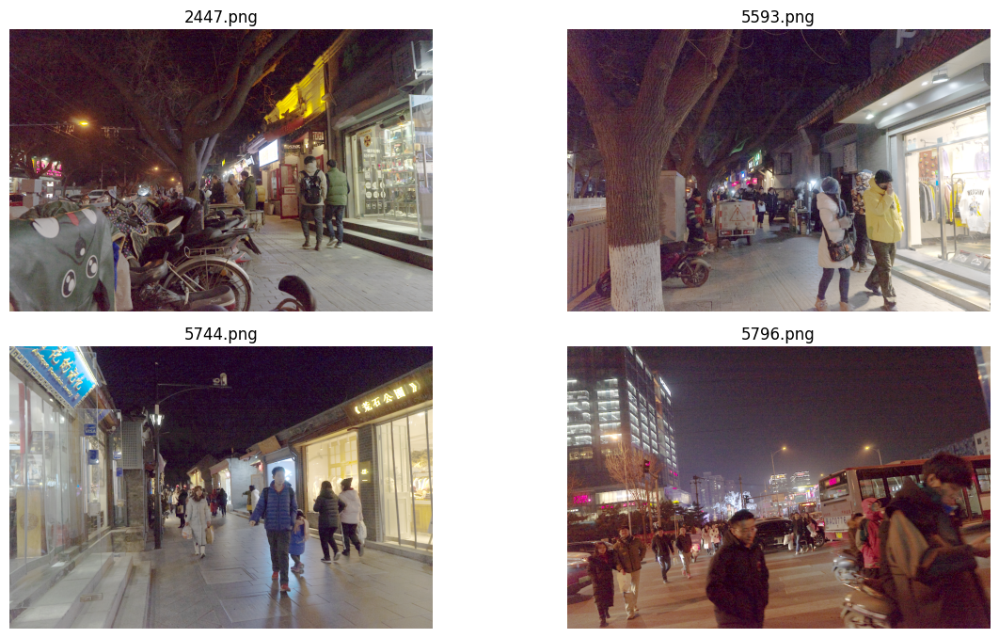

In [ ]:
c = 50 #brillo moderado.
log_transformed_images = [log_transform(image,c) for image in images]
plot_images(log_transformed_images,titles, cols=2, figsize=(12,17))

La transformación logarítimica no elimina el ruido de forma directa, aunque puede hacer que el ruido sea menos visible al comprimir valores. Se utiliza para imágenes con alto contraste donde los detalles en sombras  o áreas poco iluminadas necesitan ser realzadas.

Los valores bajos de intensidad (sombras) se amplifican más que los altos debido a la naturaleza del logaritmo, lo que hace que los detalles en áreas oscuras sean más visibles.

#### **1.4. Transformación logarítmica inversa (función exponencial)**

La fórmula es s=c⋅(er−1), donde:

*	s:  Intensidad del píxel en la imagen transformada.
*	c: La constante de escala que asegura que los valores de salida estén dentro del rango deseado.
*	r:  Intensidad del píxel en la imagen original




In [87]:
import numpy as np
import cv2

def log_inverse_transform(image, c=1.0):
    '''
    Aplica la transformación logarítmica inversa a una imagen.
    args:
        image (numpy.ndarray): Imagen de entrada.
        c (float): Constante de escala para ajustar la transformación.
    returns:
        exp_image (numpy.ndarray): Imagen transformada.
    '''
    # Separar los canales
    b, g, r = cv2.split(image)

    # Aplicar la transformación logarítmica inversa a cada canal
    b_transformed = c * (np.exp(np.float32(b) / 255) - 1)
    g_transformed = c * (np.exp(np.float32(g) / 255) - 1)
    r_transformed = c * (np.exp(np.float32(r) / 255) - 1)

    # Ajustar los valores al rango [0, 255] y convertir a uint8
    b_transformed = np.uint8(np.clip(b_transformed * 255, 0, 255))
    g_transformed = np.uint8(np.clip(g_transformed * 255, 0, 255))
    r_transformed = np.uint8(np.clip(r_transformed * 255, 0, 255))

    # Recombinar los canales transformados
    exp_image = cv2.merge((b_transformed, g_transformed, r_transformed))
    return exp_image


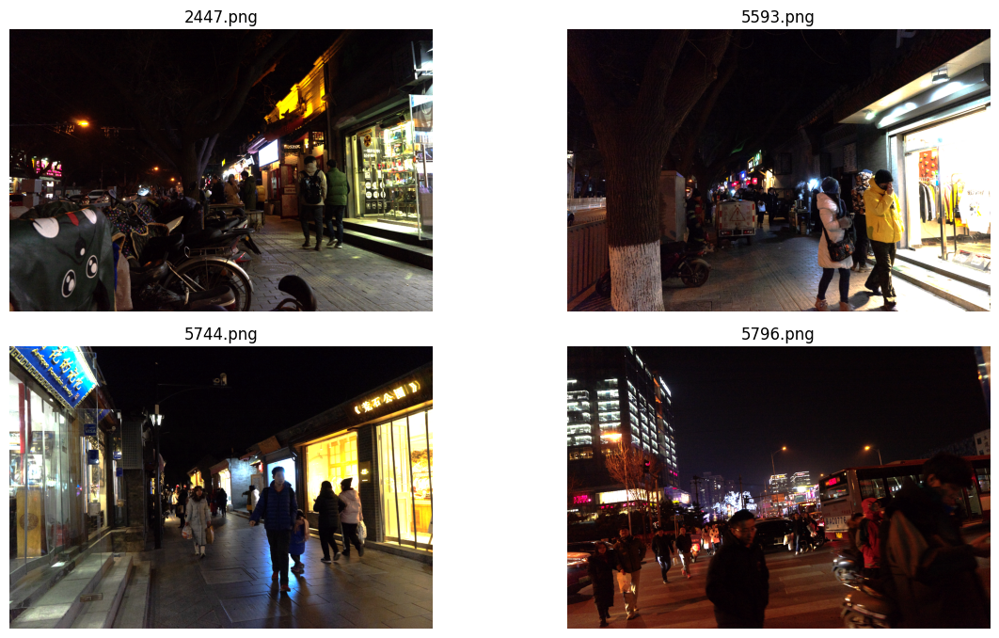

In [88]:
c = 5.0
exp_transformed_images = [log_inverse_transform(image,c) for image in images]
plot_images(exp_transformed_images,titles, cols=2, figsize=(12,17))

La transformación logarítmica inversa realza detalles en áreas brillantes de una imagen al expandir los niveles de intensidad altos. Es lo opuesto a la transformación logarítmica, que comprimir los valores brillantes y realza los oscuros.

#### **1.5. Transformaciones de la ley de potencias**
 La fórmula es s = c * r^γ , donde:
*	s:  Intensidad del píxel en la imagen transformada.
*	r:  Intensidad del píxel en la imagen original
*	c: La constante de escala.
*	γ: El exponent que determina el tipo de corrección


In [89]:
def power_law_transform(image, c=1, gamma=0.5):
    '''
    Aplica la transformación de potencia a una imagen.
    args:
        image(numpy.ndarray): Imagen de entrada
        c(float): Constante de escala.
        gamma(float): Exponente para la transformación.
    returns:
        pow_image(numpy.ndarray): Imagen transformada.
    '''

    # Separar los canales
    b, g, r = cv2.split(image)

    # Aplicar la transformación de potencia a cada canal
    b_transformed = c * np.power(np.float32(b) / 255.0, gamma)
    g_transformed = c * np.power(np.float32(g) / 255.0, gamma)
    r_transformed = c * np.power(np.float32(r) / 255.0, gamma)

    # Ajustar los valores al rango [0, 255] y convertir a uint8
    b_transformed = np.uint8(np.clip(b_transformed * 255, 0, 255))
    g_transformed = np.uint8(np.clip(g_transformed * 255, 0, 255))
    r_transformed = np.uint8(np.clip(r_transformed * 255, 0, 255))

    # Recombinar los canales transformados
    pow_image = cv2.merge((b_transformed, g_transformed, r_transformed))
    return pow_image

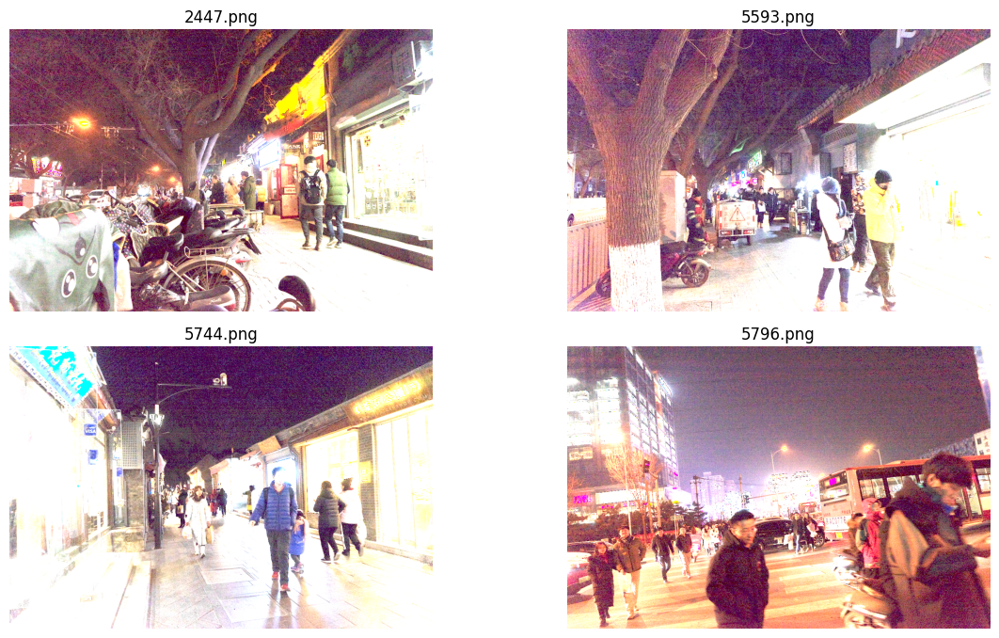

In [90]:
gamma = 0.5 # menor que 1 para aclarar sombras
c = 5
pow_images = [power_law_transform(image,c,gamma) for image in images]
plot_images(pow_images,titles, cols=2, figsize=(12,17))



Valores de γ más bajos (`γ<1`) tienden a aclarar la imagen. Valores más altos tienden a oscurecerla. La transformación no elimina ruido, de hecho, puede amplificarlo en ciertas áreas (por ejemplo, sombras con `γ<1`). No es adaptativa, por lo que afecta a toda la imagen de manera uniforme. Además, exige una normalización previa. Para funcionar correctamente los valores de intensidad (r) deben encontrarse en el rango [0,1]


# 2. **Procesamiento del histograma**

#### **2.1. Ecualización del histograma**

Es una técnica de procesamiento de imágenes que ajusta el contraste distribuyendo uniformemente los valores de intensidad en toda la imagen. Funciona remapeando los valores de los píxeles según el histograma acumulativo.

El histograma acumulativo calcula la función de distribución acumulativa (CDF) de los valores de intensidad de la imagen. Se reasignan los valores de los píxeles para que el histograma resultante sea lo más uniforme posible.

Esta técnica mejora significativamente los detalles, especialmente en imagenes de bajo contraste.  
Es automática, es decir, no emplea parámetros ajustables.

No es una función adaptativa, por lo que afecta a toda la imagen, pudiendo sobreexponer o subexponer ciertas regiones.  En imágenes de bajo rango dinámico puede realzar el ruido.

Nuestras imágenes son imágenes en color, por lo que no es posible ecualizarlas directamente con cv2.equalizeHist(). Es necesario separar el canal de luminancia, convirtiendo la imagen a un espacio de color como LAB o YUB, donde la luminancia está en un canal separado (L o Y).




In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def equalize_histogram_color(image, conversion=None):
    '''
    Aplica la ecualización de histograma al canal de luminancia de una imagen.
    args:
        image(numpy.ndarray): Imagen en formato BGR.
        conversion(string): Espacio de color, puede ser 'YUV' o 'LAB'.
    returns:
        image_equalized(numpy.ndarray): Imagen con el histograma ecualizado.
    '''
    if conversion == 'YUV':
        # Convertir de BGR a YUV
        image_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
        # Dividir los canales Y, U y V
        y_channel, u_channel, v_channel = cv2.split(image_yuv)
        # Aplicar la ecualización del histograma al canal Y
        y_channel_eq = cv2.equalizeHist(y_channel)
        # Combinar los canales nuevamente
        image_yuv_eq = cv2.merge((y_channel_eq, u_channel, v_channel))
        # Convertir de YUV a BGR
        image_equalized = cv2.cvtColor(image_yuv_eq, cv2.COLOR_YUV2BGR)

    if conversion  == 'LAB':
        # Convertir de BGR a LAB
        image_lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        # Dividir los canales L, A y B
        l_channel, a_channel, b_channel = cv2.split(image_lab)
        # Aplicar la ecualización del histograma al canal L
        l_channel_eq = cv2.equalizeHist(l_channel)
        # Combinar los canales nuevamente
        image_lab_eq = cv2.merge((l_channel_eq, a_channel, b_channel))
        # Convertir de LAB a BGR
        image_equalized = cv2.cvtColor(image_lab_eq, cv2.COLOR_LAB2BGR)

    return image_equalized


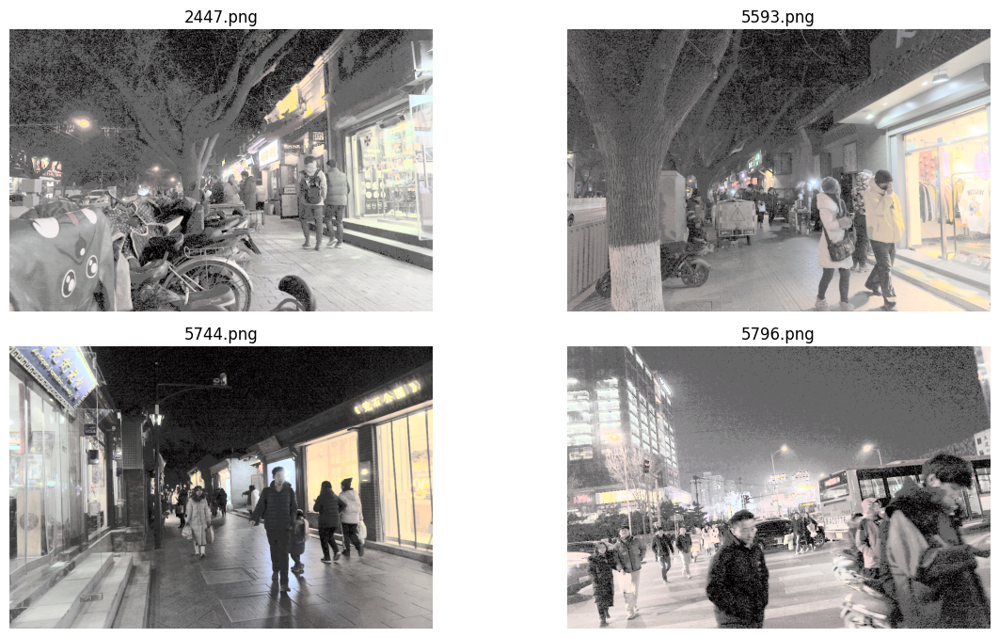

In [ ]:
equalized_images = [equalize_histogram_color(image,'LAB') for image in images]
plot_images(equalized_images,titles, cols=2, figsize=(12,17))

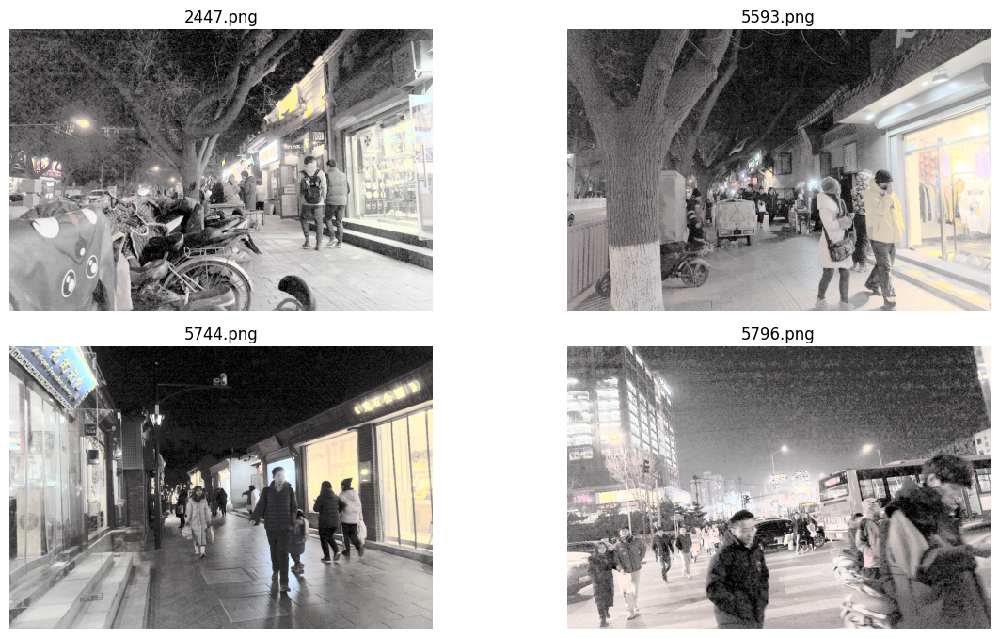

In [ ]:
equalized_images = [equalize_histogram_color(image,'YUV') for image in images]
plot_images(equalized_images,titles, cols=2, figsize=(12,17))

#### **2.2. CLAHE (Contrast Limited Adaptive Histogram Equalization)**

Divide la imagen en bloques o tiles de tamaño fijo de 8x8 o 16x16 pixels. Dentro de cada bloque, se aplica una ecualización del histograma para mejorar el contraste en esa región local.

Con el parámetro clipLimit se establece un límite en el contraste  para evitar que los píxeles más brillantes o más oscuros dominien el histograma.

Para evitar discontinuidades entre bloques, CLAHE combina suavemente las áreas adyacentes mediante interpolación, generando una transición gradual entre las regiones.

In [91]:
def equalize_histogram_clahe(image, clipLimit=2.0, tileGridSize=(8, 8)):
    '''
    Aplica la ecualización de histograma adaptativa (CLAHE) al canal de luminancia de una imagen en color (espacio LAB).

    args:
        image (numpy.ndarray): Imagen de entrada.
        clipLimit (float): Límite de contraste para CLAHE.
        tileGridSize (tuple): Tamaño de los bloques para CLAHE.
    Returns:
        image_equalized(numpy.ndarray): Imagen transformada.
    '''
    # Convertir la imagen al espacio de color LAB
    image_lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    # Dividir la imagen en los canales L, A y B
    l, a, b = cv2.split(image_lab)
    # Crear el objeto CLAHE
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    # Aplicar CLAHE al canal L (luminancia)
    l_equalized = clahe.apply(l)
    # Combinar los canales nuevamente
    image_lab_equalized = cv2.merge((l_equalized, a, b))
    # Convertir de LAB a BGR
    image_equalized = cv2.cvtColor(image_lab_equalized, cv2.COLOR_LAB2BGR)
    return image_equalized


cliplimit:  Controla cuánto se limita el contraste.  Un valor bajo reduce el efecto de CLAHE, mientras que un valor alto lo amplifica.

tileGridSize: Tamaño de los bloques en los que se divide la imagen. Por ejemplo, (8,8) divide la imagen en bloques de 8x8 píxeles. Valores típicos (8x8) o (6,6).

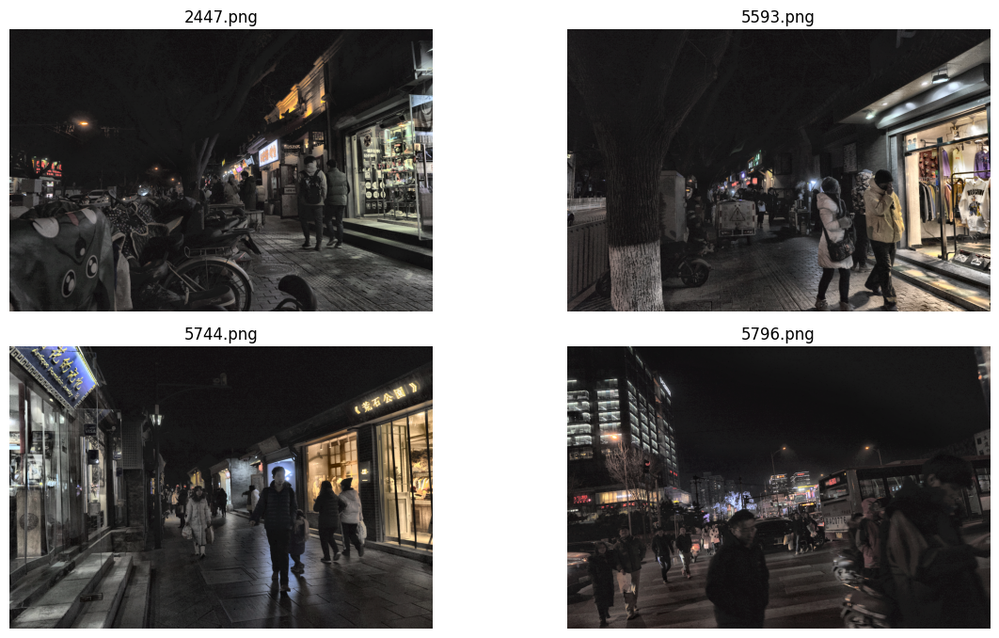

In [97]:
clipLimit=10
tileGridSize=(16,16)
clahe_equalized_images = [equalize_histogram_clahe(image,clipLimit,tileGridSize) for image in images]
plot_images(clahe_equalized_images,titles, cols=2, figsize=(12,17))

CLAHE es adaptativo, es decir, mejora el contraste de regiones locales en lugar de toda la imagen, lo que es útil cuando las áreas tienen distintos niveles de iluminación.

Al limitar el contraste máximo, evita que las áreas brillantes u oscuras se vuelvan dominantes o que el ruido se amplifique demasiado.

# 3. **Operadores aritméticos**

Los operadores aritméticos realzian cálculos entre píxeles para corregir la iluminación no uniforme o resltar detalles.


*   **Suma**: Incrementa el brillo al añadir un valor constante a cada píxel.
*   **Multiplicación**: Incrementa el contraste multiplicando los valores de intensidad por un factor.
*   **Resta**: Útil para eliminar sombras o reflejos al restar una referencia o patrón de fondo.
*   **Division**: Corrige variaciones de iluminación dividiendo la imagen por un patron de luz.



In [54]:
def arithmetic_operations(image, brightness, operation):
    '''
    Aplica una operación de suma, resta, división o multiplicación según lo requerido.

    Args:
        image (numpy.ndarray): Imagen de entrada.
        brightness (int): Valor de brillo o divisor.
        operation (string): Operación a realizar ('addition', 'subtraction', 'division', 'multiplication').

    Returns:
        numpy.ndarray: Imagen transformada.
    '''
    # Suma o resta
    if operation in ('addition', 'subtraction'):
        brightness_matrix = np.ones_like(image, dtype=np.uint8) * brightness
        if operation == 'addition':
            image_out = cv2.add(image, brightness_matrix)
        else:
            image_out = cv2.subtract(image, brightness_matrix)

    # Multiplicación o división
    elif operation in ('division', 'multiplication'):
        # Convertir a float para operaciones precisas
        image_float = image.astype(np.float32)
        if operation == 'division':
            image_out = cv2.divide(image_float, brightness)
        else:
            image_out = cv2.multiply(image_float, brightness)

        # Escalar al rango válido [0, 255]
        image_out = np.clip(image_out, 0, 255).astype(np.uint8)

    return image_out



#### **3.1. Suma**


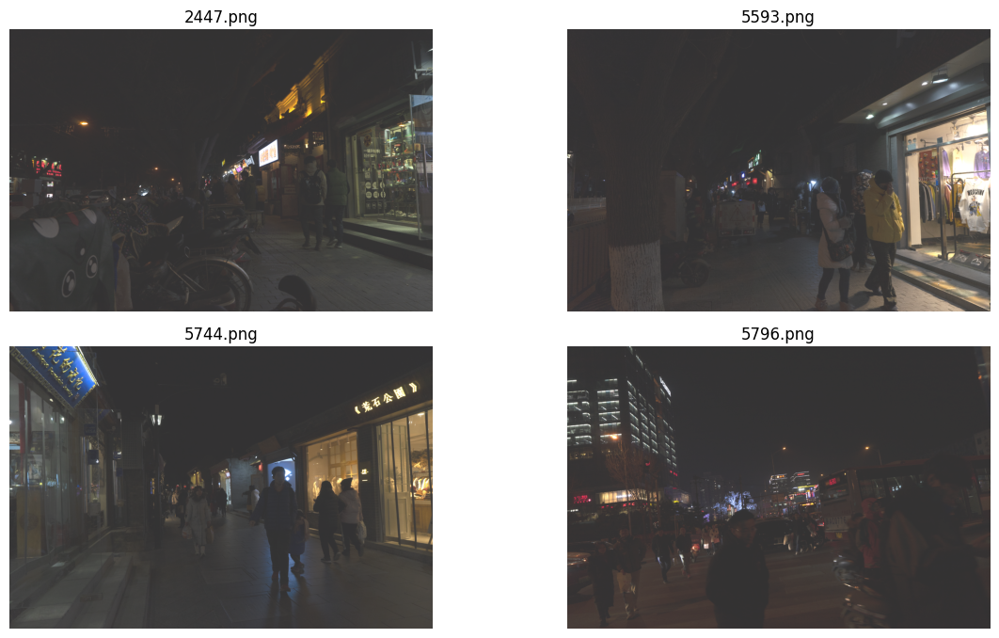

In [47]:
brightness = 50
arit_oper_images = [arithmetic_operations(image,brightness,'addition') for image in images]
plot_images(arit_oper_images,titles, cols=2, figsize=(12,17))

#### **3.1. Resta**


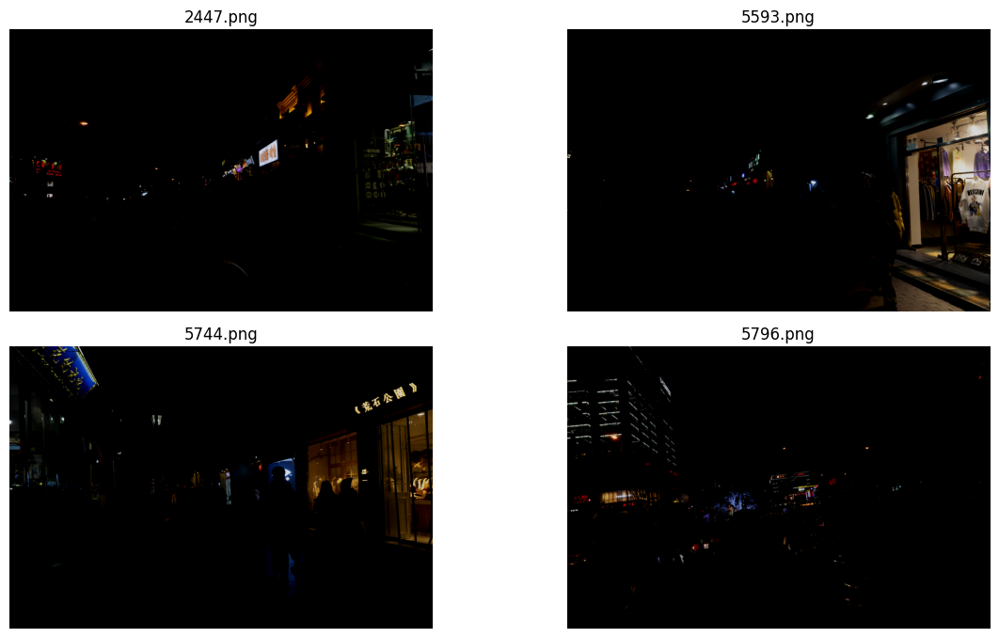

In [48]:
brightness = 40
arit_oper_images = [arithmetic_operations(image,brightness,'subtraction') for image in images]
plot_images(arit_oper_images,titles, cols=2, figsize=(12,17))

#### **3.1. Multiplicación**


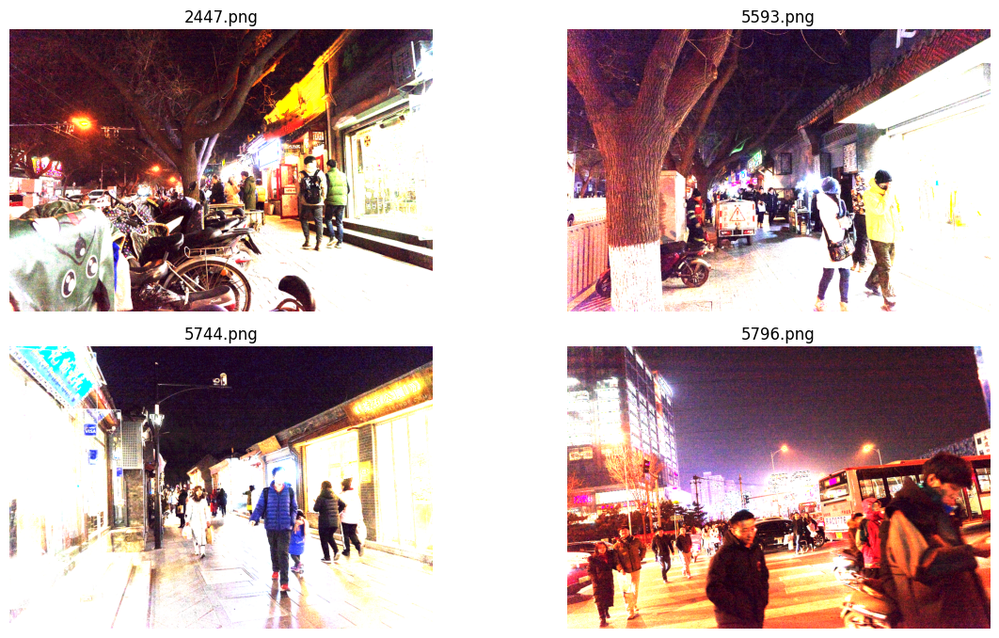

In [49]:
brightness = 30
arit_oper_images = [arithmetic_operations(image,brightness,'multiplication') for image in images]
plot_images(arit_oper_images,titles, cols=2, figsize=(12,17))

#### **3.1. División**


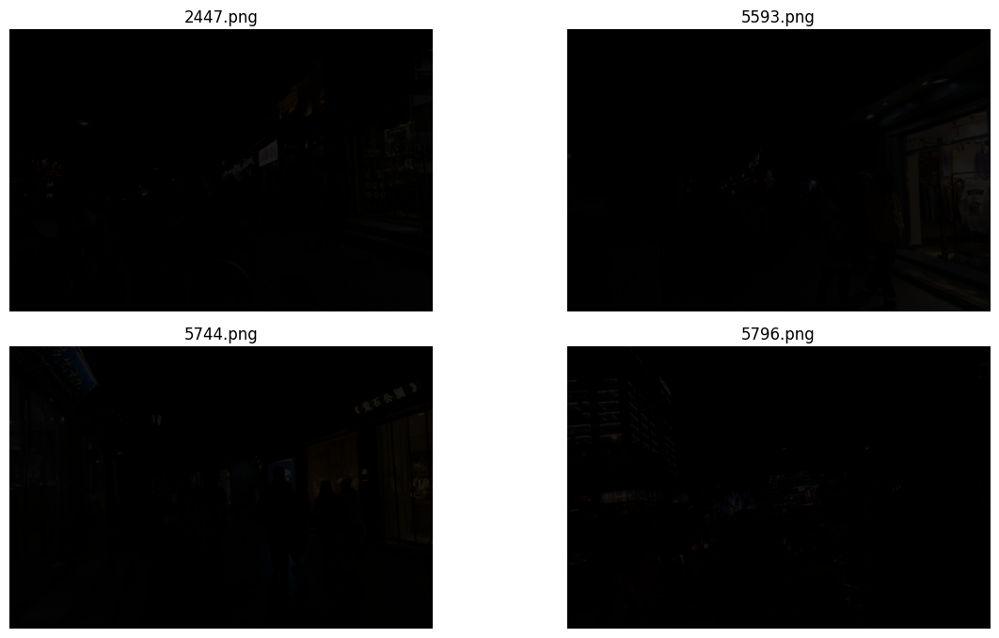

In [59]:
brightness = 10
arit_oper_images = [arithmetic_operations(image,brightness,'division') for image in images]
plot_images(arit_oper_images,titles, cols=2, figsize=(12,17))